**Before reading**

1) For the initial datasets were dropped in .xls format I parsed them directly from .xls

2) During parsing I faced a problem, because excel interpreted some numeric values as datetime types, so I changed it's type to string directly there, in Excel, and all the troubles disappeared. Such problem columns were: OUTGOING_OCT_16, OUTGOING_NOV_16, GPRS_OCT_16, GPRS_NOV_16, REVENUE_OCT_16, REVENUE_NOV_16 in both files.

3)Perhaps there may be some semantic, illustrative and even linguistics errors: my English is not so good by the time I'm writing this disclaimer, I tried hard and hope you will enjoy it:)

**0)Importing data and presets**

In [2]:
# PEP8 check
# pip install flake8 pycodestyle_magic

In [3]:
# %load_ext pycodestyle_magic
# %pycodestyle_on

In [4]:
conda install -c plotly plotly

^C

Note: you may need to restart the kernel to use updated packages.


In [6]:
# importing libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px

import numpy as np
import pandas as pd
from datetime import datetime, date

import warnings
warnings.simplefilter(action='ignore')

KeyboardInterrupt: 

In [ ]:
#reading from excel
nov_df = pd.read_excel(r'test.xlsx')
dec_df = pd.read_excel(r'train.xlsx')

rez_df = pd.concat([nov_df, dec_df], ignore_index=True).drop('USER_ID', axis=1)

# Matplotlib

**1)Histogram**

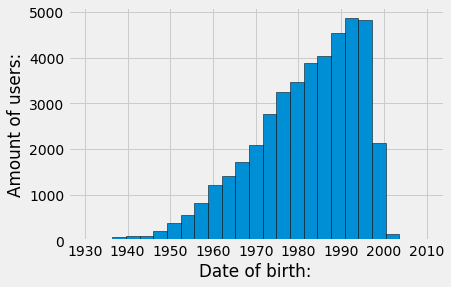

In [7]:
with plt.style.context('fivethirtyeight'):
    date_range = (pd.to_datetime('1930', format='%Y'),
                  pd.to_datetime('2010', format='%Y'))
    hist = plt.hist(rez_df['BIRTHDAY'],
                    edgecolor='black',
                    bins=25, range=date_range)
    plt.xlabel('Date of birth:')
    plt.ylabel('Amount of users:')

`The Histogram illustrates the distribution of users by their age of birth may be usefull for advertisement and promotion`

*Note:* `there are no users above 18 y'old for their accounts were registrated on guardians`

**2)Combined boxplots**

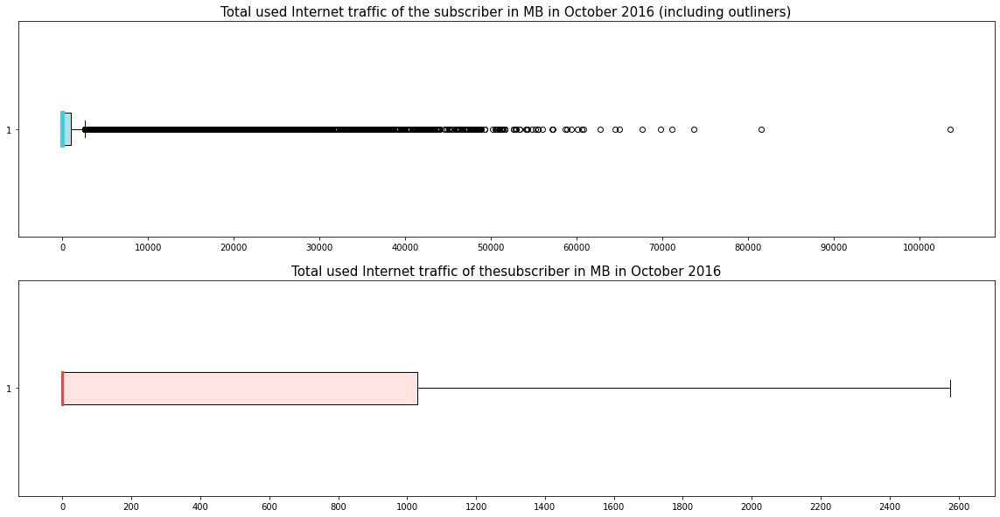

In [8]:
figure, axes = plt.subplots(nrows=2, ncols=1, figsize=(20,10))

# first boxplot
fmp =dict(linestyle='-', linewidth=5, color='#3CD0DE')
axes[0].boxplot(rez_df['GPRS_NOV_16'].dropna(),
                vert=False, patch_artist=True,
                boxprops={'facecolor': 'powderblue'},
                medianprops=fmp)
txt = 'Total used Internet traffic of the subscriber in MB in October 2016 (including outliners)'
axes[0].set_title(txt, fontsize=15)
axes[0].locator_params(axis="x", nbins=20)


# second boxplot
smp = dict(linestyle='-', linewidth=3, color='#EE4747')
axes[1].boxplot(rez_df['GPRS_NOV_16'].dropna(), 
                vert=False, showfliers=False,
                patch_artist=True,
                boxprops={'facecolor': 'mistyrose'},
                medianprops=smp)
txt = 'Total used Internet traffic of thesubscriber in MB in October 2016'
axes[1].set_title(txt, fontsize=15)
axes[1].locator_params(axis="x", nbins=20)

`The provided boxplots show the importance of outliners in evaluating current dataset, at the same time it should be mentioned taht nevertheless median usage of MB per user is about zero`

In [9]:
# cleanup
figure.clf()
plt.close(figure)

**3)Barplot**

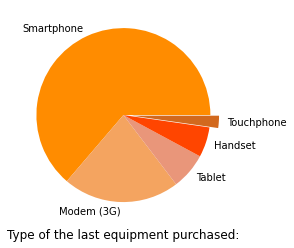

In [10]:
values = rez_df['ASSET_TYPE_LAST'].value_counts()
values = values.iloc[:-1]
values_colors = ['darkorange', 'sandybrown',
                 'darksalmon', 'orangered',
                 'chocolate']
values_explosion = (0, 0, 0, 0, 0.1)
plt.xlabel('Type of the last equipment purchased:', fontsize=12)
plt.pie(values, labels=values.index,
        colors=values_colors, explode=values_explosion)

plt.show()

`The Pie-chart illustrates the rango of device popularity, where touchphone is the used popular one`

**4)The correlogram**

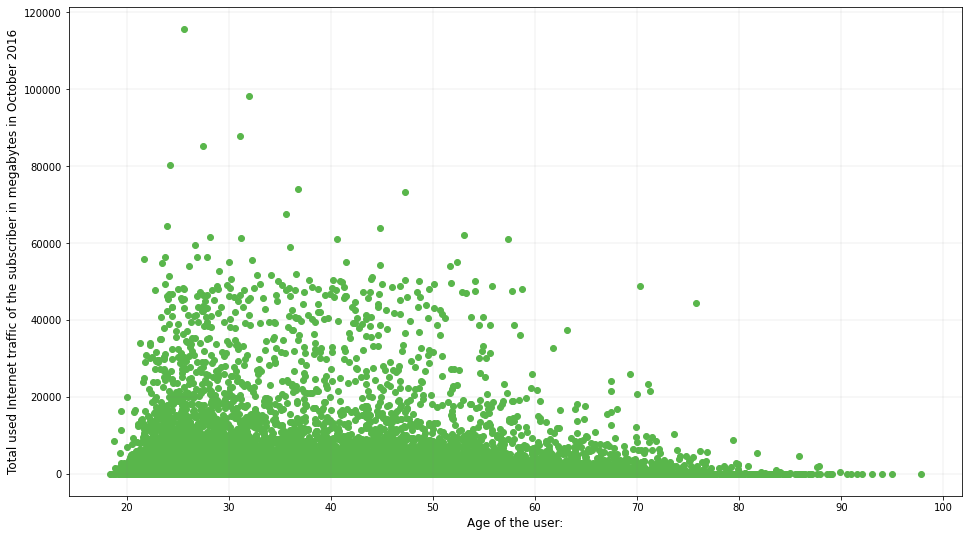

In [11]:
# useful only data retrieving
temp_df = rez_df[["BIRTHDAY", "GPRS_OCT_16"]]
temp_df = temp_df.dropna()
temp_df["BIRTHDAY"] = temp_df["BIRTHDAY"].apply(lambda x:
                                    date.today().year - (x.year + x.month/12))
temp_df["BIRTHDAY"] = temp_df[temp_df["BIRTHDAY"].le(100)]


# the graph
scatter = plt.scatter(temp_df["BIRTHDAY"],
                      temp_df["GPRS_OCT_16"],
                      cmap='summer', c='#59B64B')
plt.xlabel('Age of the user:', fontsize=12)
plt.ylabel('Total used Internet traffic of the subscriber in megabytes in October 2016',
            fontsize=12)
scatter.axes.grid(color='grey', linestyle='-',
                  linewidth=0.25, alpha=0.5)
scatter.figure.set_size_inches(16, 9)

`The main idea I wanted to illustrate here is that there is actaully a correlation between age(it's possible values) and the amount of traffic used. Moreover one can claearly see that almost all the outliners is distributed between 20 and 50 y\o users`

**5)Bar chart**

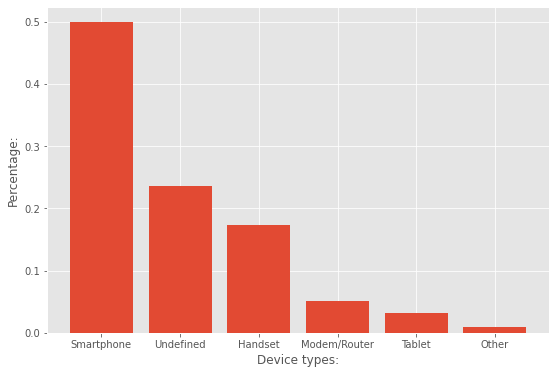

In [12]:
with plt.style.context('ggplot'):
    value = rez_df['DEVICE_TYPE_BUS'].value_counts(normalize=True)
    figure = plt.figure(figsize=(9, 6))
    barplot = plt.bar(value.index, value)
    plt.xlabel('Device types:')
    plt.ylabel('Percentage:')

`Here the distribution between the type of device that the subscriber uses most of his time in the fall is clearly and respectfully illustrated with the help of the bar chart. So the most popular device is smartphone, and the least popular one is tablet`

# Seaborn

**6)Correlogram**

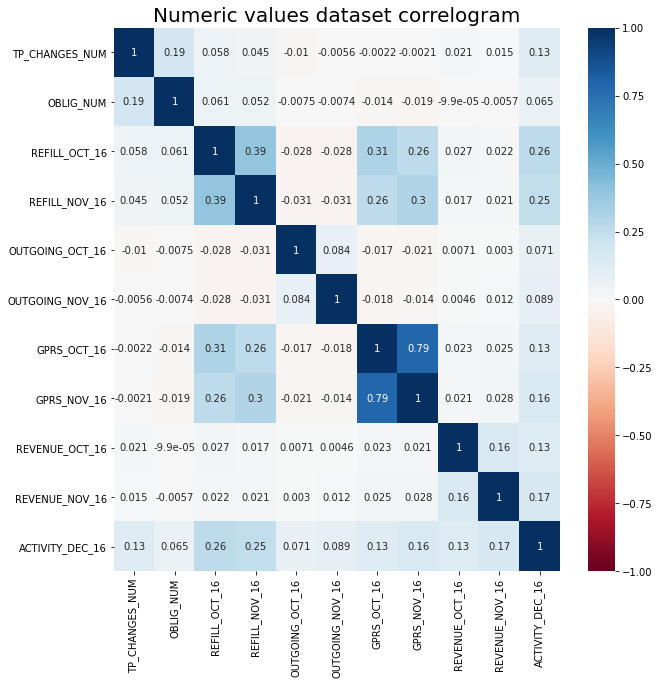

In [13]:

numeric_features = rez_df.select_dtypes('number').columns

# Ploting
figure, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(rez_df[numeric_features].corr(),
            vmin=-1, vmax=1, cmap='RdBu',
            annot=True, center=0)
plt.title('Numeric values dataset correlogram', fontsize=20)
plt.show()

In [14]:
figure.clf()
plt.close(figure)

`The correlogram may be usefull for the further exploration of the dependancies between the columns`

**7)Violinplot**

Text(0.5, 1.0, 'Calls devision')

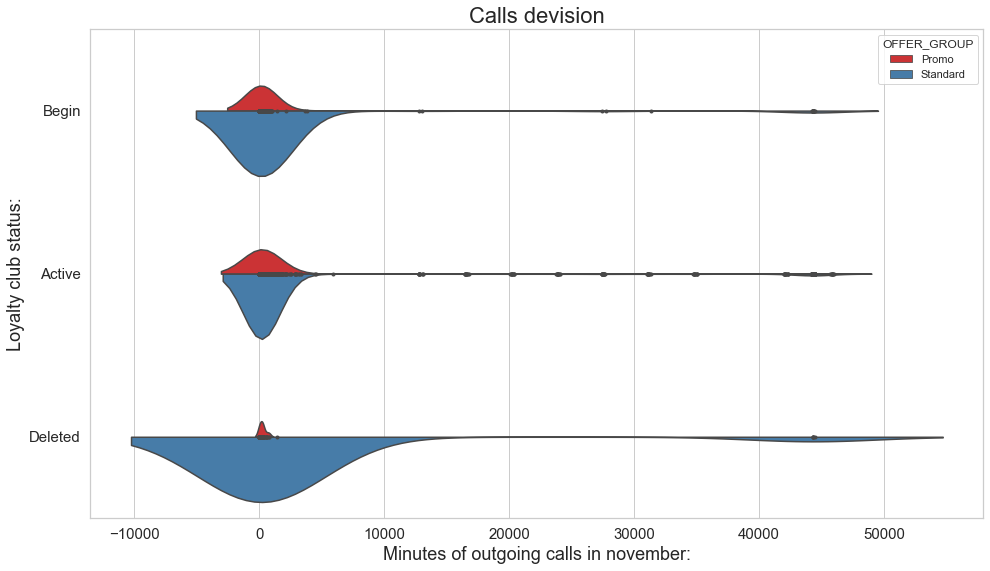

In [15]:

# plot
sns.set_theme(style="whitegrid")
fig = plt.figure(figsize=(16,9))
ax = sns.violinplot(x='OUTGOING_NOV_16', y = 'MLLS_STATE', hue="OFFER_GROUP",
                    data=rez_df, palette="Set1", split=True,
                    scale="count", inner='points')

# axes
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.xlabel('Minutes of outgoing calls in november:', fontsize=18)
plt.ylabel('Loyalty club status:', fontsize=18)
plt.title('Calls devision', fontsize=22)

`The given violinplot demonstrates that there exists a notable gap in the usage of cellular between two offer groups as well as between users whith different loyality club statuses. Also it illustrates the existance of the tail of over- using subscribers  `

**8)Joined plot**

Text(0.5, 76.99999999999993, 'Correlation between sent calls and internet usage per client( cleansed)')

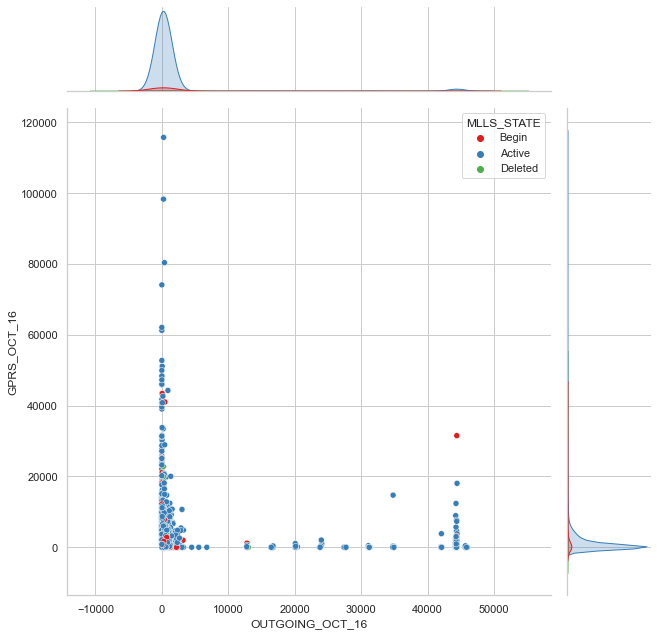

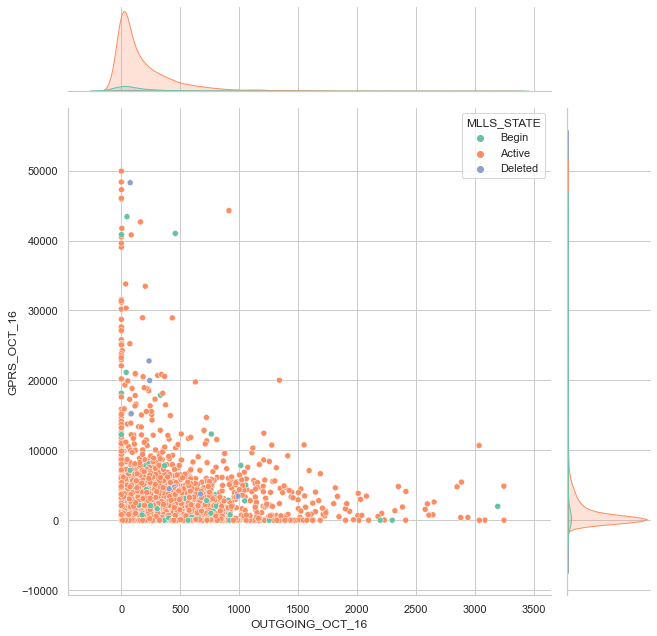

In [16]:
# temp_df = rez_df[['OUTGOING_OCT_16', 'GPRS_OCT_16']].
#                    apply(lambda x: np.log(x+0.001))
# temp_df['GENDER'] = rez_df['GENDER']

# outliners cleanup
excluding_mask = rez_df['OUTGOING_OCT_16'].le(4000) & rez_df['GPRS_OCT_16'].le(50000)
temp_df = rez_df[['OUTGOING_OCT_16','GPRS_OCT_16', 'MLLS_STATE']]
temp_df = temp_df[excluding_mask]

# initial dataset
jointplot1 = sns.jointplot(data=rez_df,
                           x="OUTGOING_OCT_16",
                           y="GPRS_OCT_16",
                           hue = 'MLLS_STATE',
                           palette="Set1", height=9)
plt.xlabel('Correlation between sent calls and internet usage per client( uncleansed)',
           fontsize=18, labelpad=20)


# cleansed one
jointplot2 = sns.jointplot(data=temp_df,
                           x="OUTGOING_OCT_16",
                           y="GPRS_OCT_16",
                           hue = 'MLLS_STATE',
                           palette="Set2", height=9)
plt.xlabel('Correlation between sent calls and internet usage per client( cleansed)',
           fontsize=18, labelpad=100)

`Despite the fact that joint plot is as thing in itself is rather overcomplicated I do wanted to draw two of them nearby to show how outliners influence the final statistics and data distribution as well as to determine: is there a covariance that pearson's ration method left unnoticed but which existed on an intuitive level. At the first grapg we can see a small tail in the joint density graph that we are quite familiar with from violinplot graph analysis. Except all the information mentioned above, it can be admitted that there are clearly seen some memberclub status outliners that may be mentioned and reported to the company to improve the performance`

**9)Catplot**

Text(15.719428240740747, 0.5, 'Average number of tariff plan changes:')

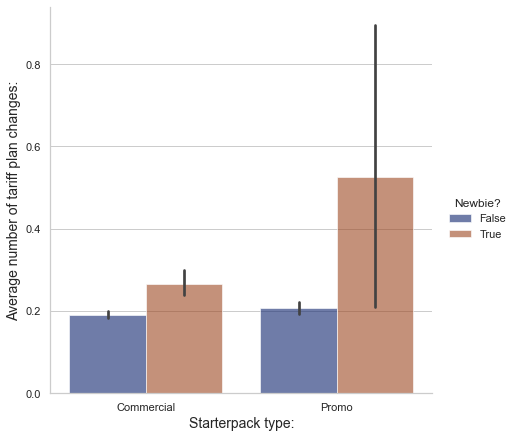

In [17]:
# the graph
g = sns.catplot(
    data=rez_df, kind="bar",
    x='START_PACK', y="TP_CHANGES_NUM", hue="PORTED_IN",
    palette="dark", alpha=.6, height=6)

# additional info setups
g._legend.set_title('Newbie?')

plt.xlabel('Starterpack type:', fontsize=14)
plt.ylabel('Average number of tariff plan changes:', fontsize=14)

`The provided catplot helps us to retrieve the most unpopular starterpack type, which users (most of them were recently ported) in prefered to get rid of it and change their plan`

**10)Distplot**

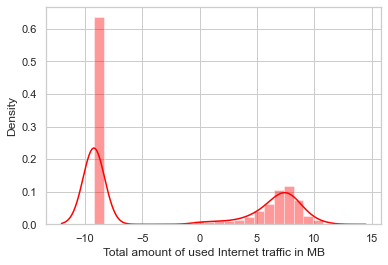

In [18]:
temp_df = rez_df['GPRS_OCT_16'].apply(lambda x: np.log(x+0.0001))
sns.distplot(a=temp_df, hist=True, kde=True, color="red")
plt.xlabel('Total amount of used Internet traffic in MB')
plt.show()

`Here the data representing the total amount of used Internet traffic of the subscriber in megabytes, was trivially scaled to even more clearly show the irregularitie of the distribution` 

# Plotly

**11)Polar Chart**

In [1]:
values = rez_df['USAGE_AREA'].value_counts()

px.line_polar(r=values, theta=values.index,
              line_close=True, template='plotly_dark')

NameError: name 'rez_df' is not defined

`Here in rather robust way the ratio of the types of locality where the subscriber spends most of his time ratio is shown. The most wounderful fact is that the spider radar allows us to represent ddata both in absolute and relative values`

*Note:* `The Undefied part is rather significant to allow us make certain conclusion based on purpose`

**12)Line chart**

In [20]:
# data processing
temp_df = rez_df[["BIRTHDAY", "OUTGOING_OCT_16"]]
temp_df["BIRTHDAY"] = temp_df["BIRTHDAY"].apply(lambda x:
                                    date.today().year - (x.year + x.month/12))
temp_df["BIRTHDAY"] = temp_df[temp_df["BIRTHDAY"].le(70)]

temp_df = temp_df.groupby("BIRTHDAY").median().reset_index()

# plotting
px.line(temp_df, x= 'BIRTHDAY', y='OUTGOING_OCT_16',
        labels={'BIRTHDAY':'Age', 'OUTGOING_OCT_16':'Outgoing minutes'})

**13)Density Heatmap**

`Here we can see the distribution of the outgoing calls in minutes by age, basing on this plot mobile provider may generate special tariffs for example for youth, for it is shown that they tend to speak on phone more than others`

In [21]:
# data preparation
temp_df = rez_df[['BIRTHDAY', 'TP_CURRENT']]
temp_df['BIRTHDAY'] = temp_df['BIRTHDAY'].apply(lambda x:
                                                date.today().year - (x.year + x.month/12))
temp_df['BIRTHDAY'] = temp_df[temp_df['BIRTHDAY'].le(100)]

# plotting
fig = px.density_heatmap(temp_df, x='TP_CURRENT', y='BIRTHDAY',
                         marginal_x ='histogram',
                         title='Tariff and Birth dates distribution',
                         labels={'BIRTHDAY':'Birth date', 'TP_CURRENT':'Tariff plan'})
fig.show()

**14)Joint histogram and violin plot**

In [22]:
# ah, shit, here we go again, almost again:)

temp_df = rez_df["BIRTHDAY"]
temp_df = temp_df.apply(lambda x:
                                date.today().year - (x.year + x.month/12))
temp_df = temp_df[temp_df.le(100)]

fig = px.histogram(temp_df, marginal = 'violin',
                   title='User age histogram + violinplot')
fig.show()

*For in plotly ecerything looks better <s>and it is 4:05 am</s>*

`The given joint plot not only illustrates the distribution of the users by their current age but also owing to the violin plot we can also find quickly median, mean and other statistical features just on spot`

`On this heat map we can notice the tariff plan preferences based on the age of subscriber`

**15)Finally let's check the myth, wether women are more talkative on phone than men**

In [23]:
# let's scale the data first
temp_df = rez_df[["OUTGOING_NOV_16", "GENDER"]]
temp_df[["OUTGOING_NOV_16"]] = temp_df["OUTGOING_NOV_16"].apply(lambda x: np.log(x + 0.00001))

# and then plot
px.box(temp_df, x="OUTGOING_NOV_16", y="GENDER",
       template='ggplot2', title='MythBusting boxplots',
       labels={'GENDER':'Gender', 'OUTGOING_NOV_16':'Outgoing minutes on phone'})

`It may seem intolerate, especially nowadays, but it is just statistics. And the statistics shows us that women are quite more talkative, especially if we evaluate both of the medians. So:`

**The myth approved**